In [204]:
import xarray as xr
import os
from matplotlib import pyplot as plt
import numpy as np
import glob
from datetime import datetime

In [149]:
os.chdir('/disk/scratch/local/hcarstairs/')


In [238]:
files = glob.glob('*clean.nc')
files

['TDX_DEM_GAB_SM_ML16_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_GAB_SM_ML10_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_GAB_SM_ML3_fF_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_GAB_SM_ML5_fF_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_GAB_SM_ML10_fF_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML16_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML3_fF_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML3_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_GAB_SM_ML16_fF_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML10_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_GAB_SM_ML5_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_GAB_SM_ML3_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML5_fT_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML16_fF_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML10_fF_unwS_H_tiles10_merged_clean.nc',
 'TDX_DEM_PER_HS_ML5_fF_unwS_H_tiles10_merged_clean.nc']

In [ ]:
ds = xr.open_dataset(files[0])

In [ ]:
def metadata(timeIndex,field):
    """
    timeIndex: int - the index of time dimension in netCDF file
    field: str - desired metadata field
    
    returns the value, taken from metadata.csv (copy stored in jupyter home drive)
    
    """
    date = np.datetime_as_string(ds.isel(t=timeIndex).t, unit='D')
    with pd.read_csv('/home/s1332488/metadata.csv') as df:
        return df[df.date==date].iloc[0][field]

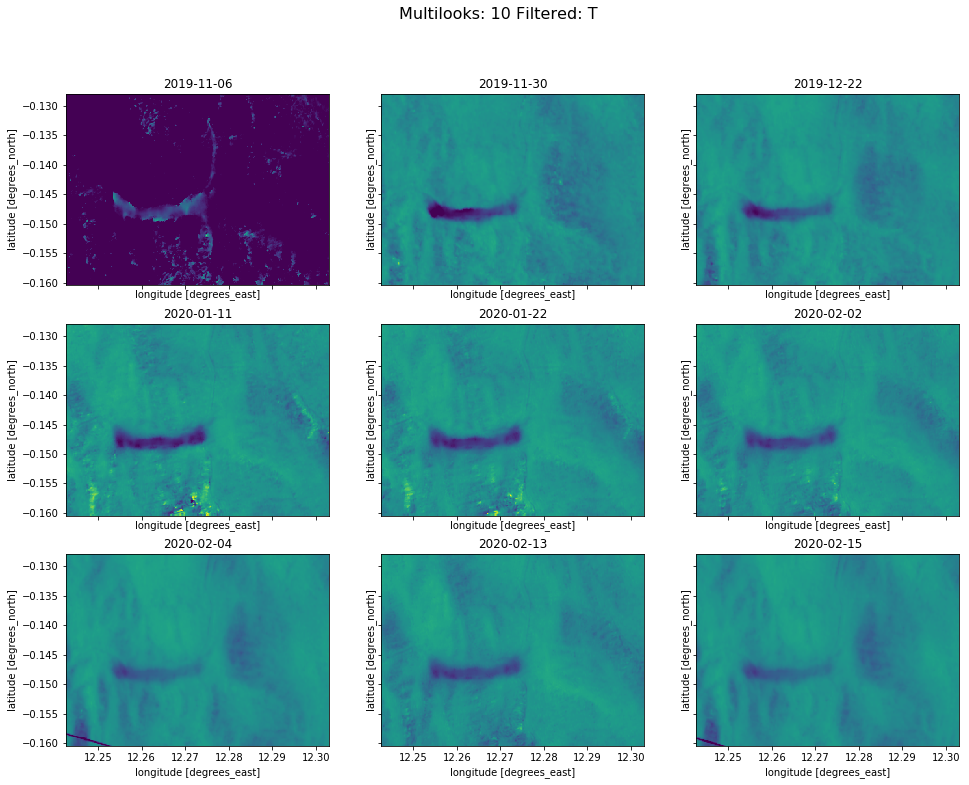

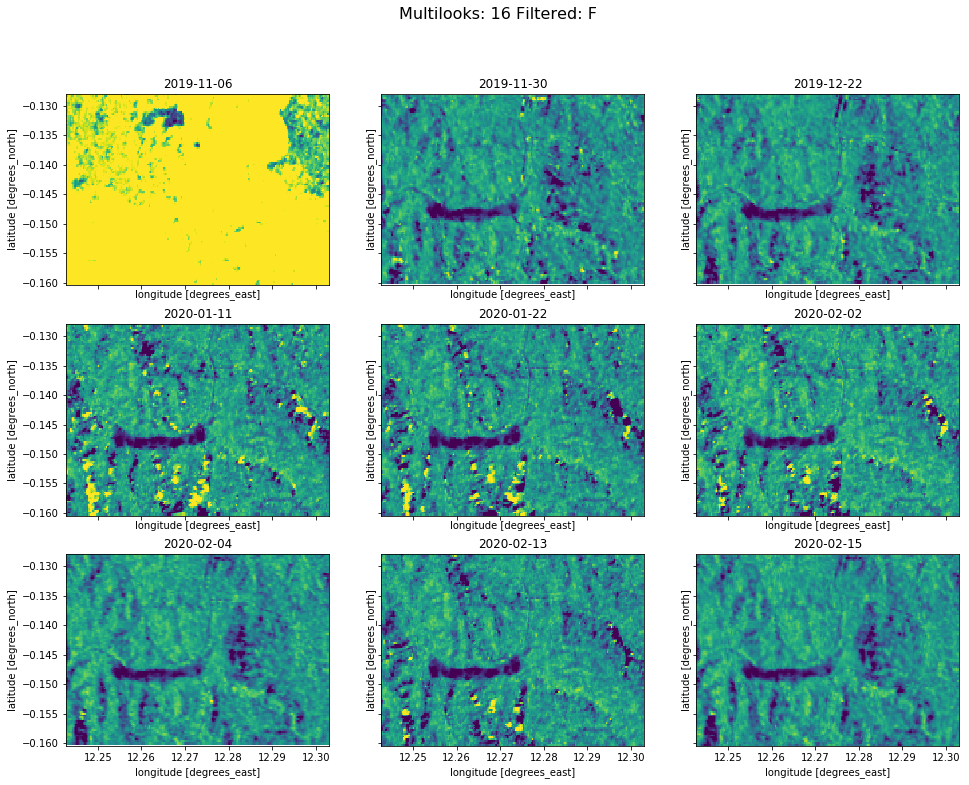

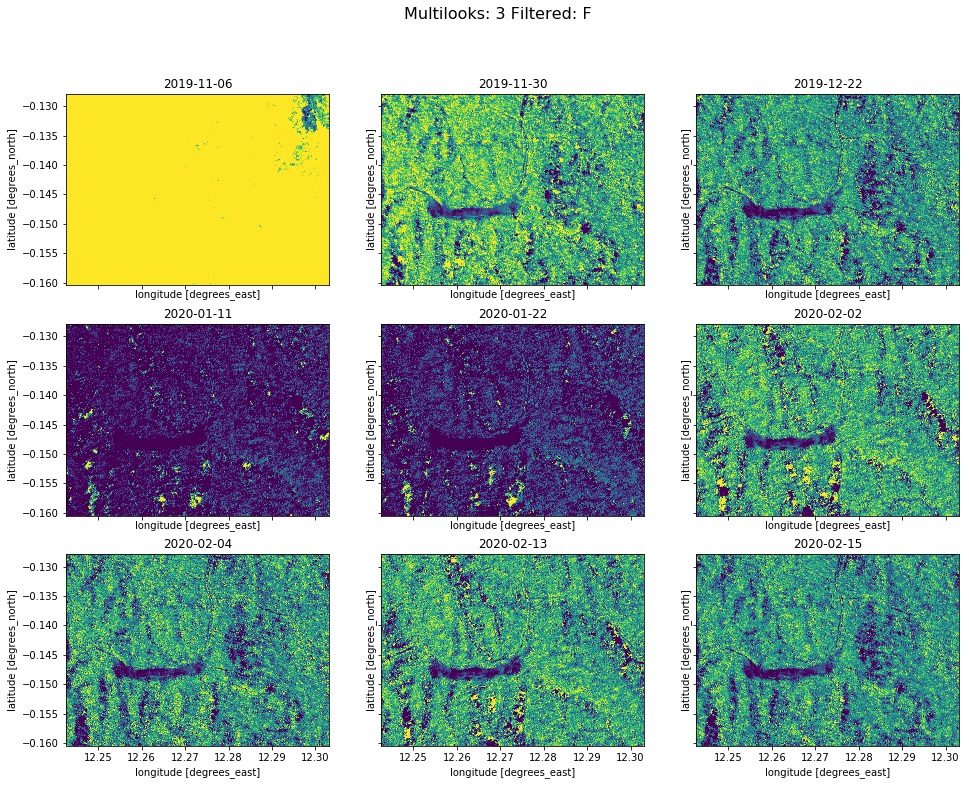

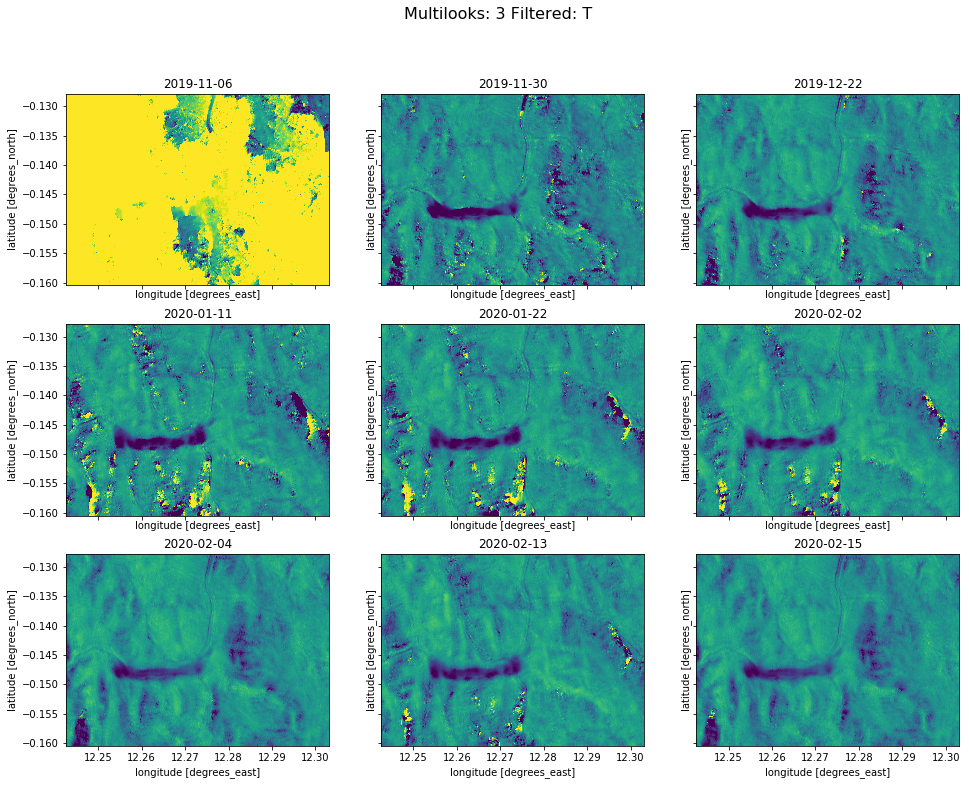

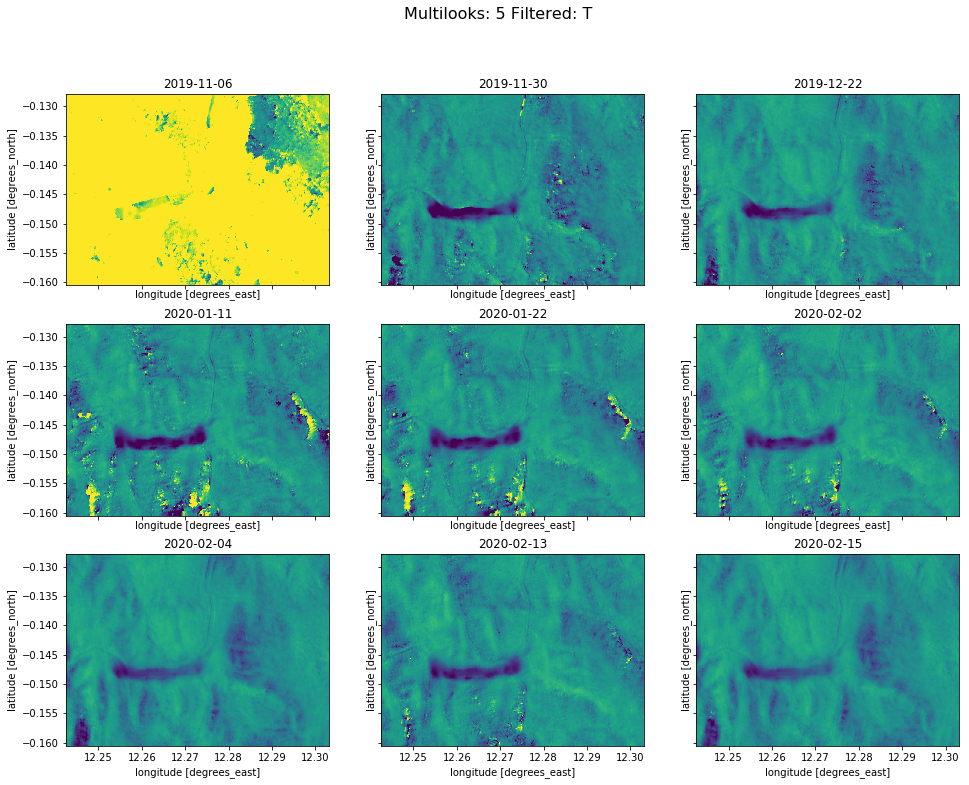

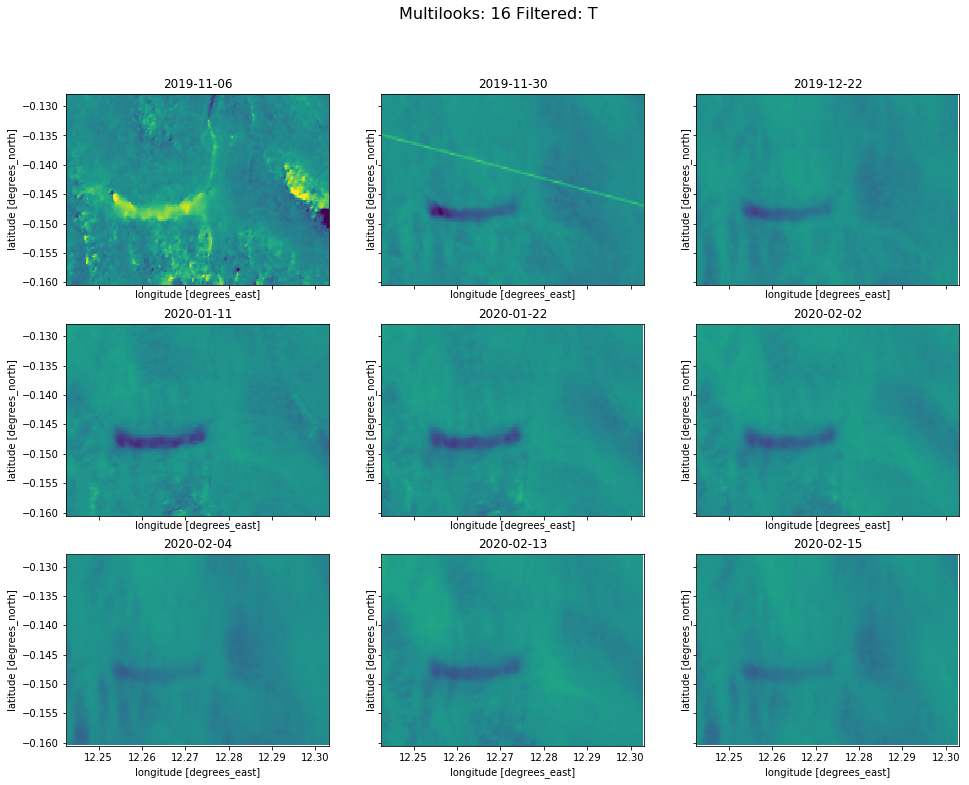

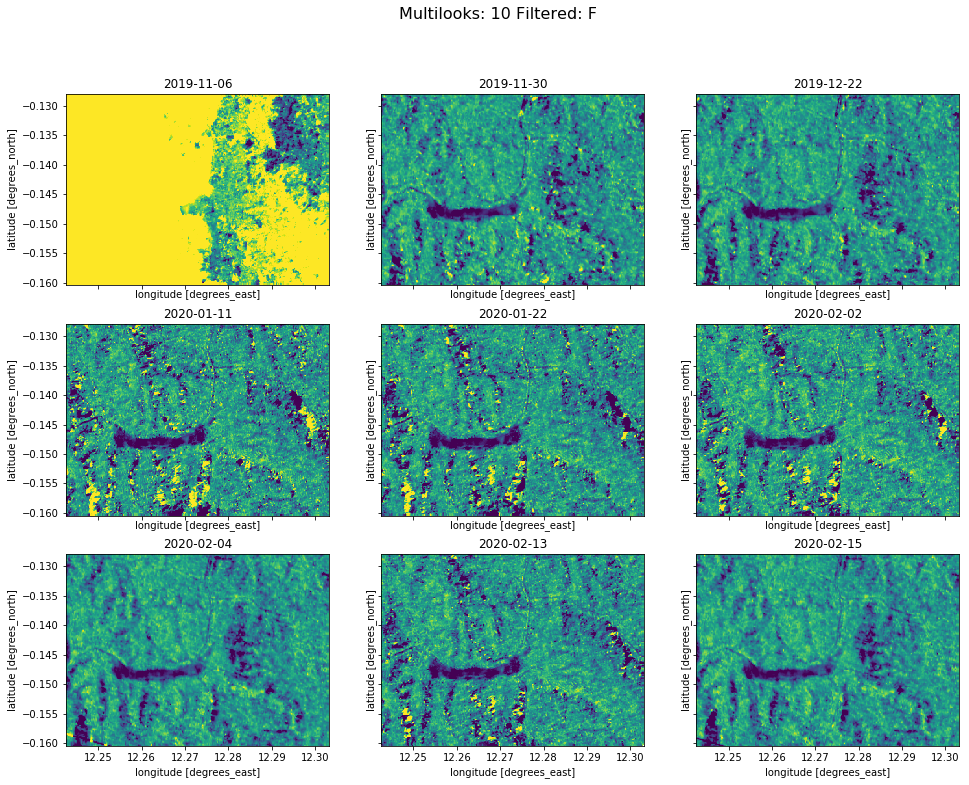

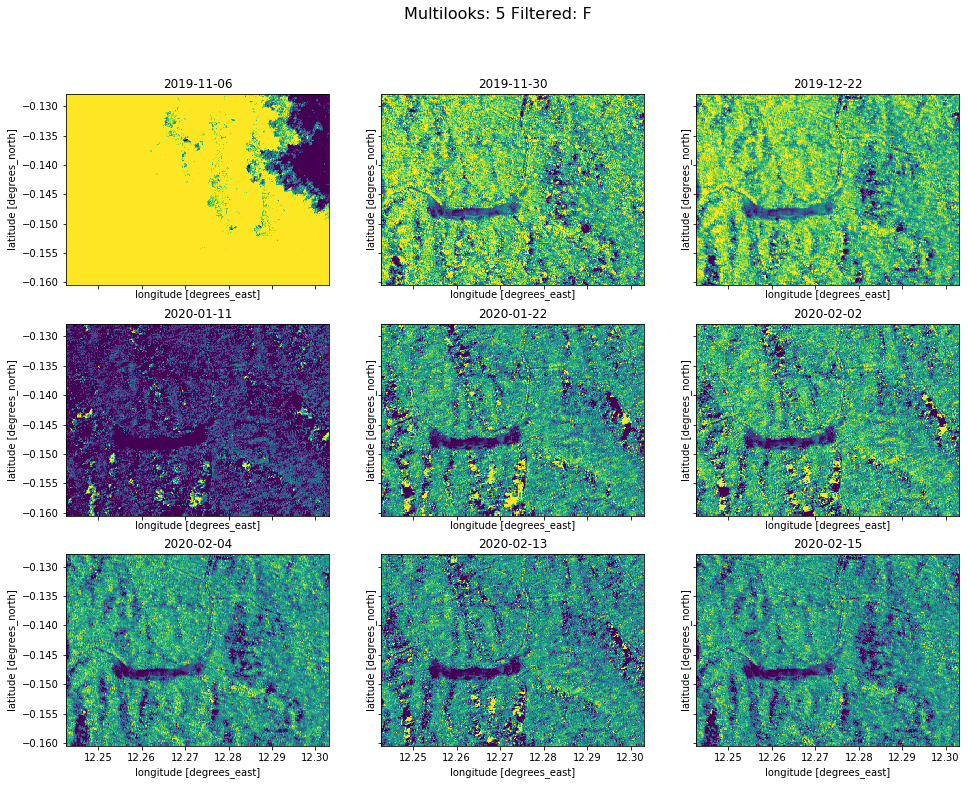

In [229]:
def plot_height_GAB(file):
    
    ml = file.split('ML')[1].split('_')[0]
    filtered = file.split('_f')[1].split('_')[0]
    
    with xr.open_dataset(file) as ds:
    
        fig,axs = plt.subplots(3,3,figsize=(16,12),sharex=True,sharey=True)
        a=0
        for i in [0,1,3,5,6,7,8,10,11]:
            ds.height_corrected.isel(t=i).plot(ax=axs.reshape(-1)[a],vmin=-10,vmax=10,add_colorbar=False)
            axs.reshape(-1)[a].set_title(np.datetime_as_string(ds.t[i],unit='D'))
            a+=1

        fig.suptitle('Multilooks: '+ml+' Filtered: '+filtered, fontsize=16)

        plt.savefig(file.split('.nc')[0]+'_heightPlot.png',dpi=300)

for f in files:
    if 'GAB' in f:
        plot_height_GAB(f)

TDX_DEM_PER_HS_ML10_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML16_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML10_fF_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML16_fF_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML5_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML5_fF_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML3_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML3_fF_unwS_H_tiles10_merged.nc


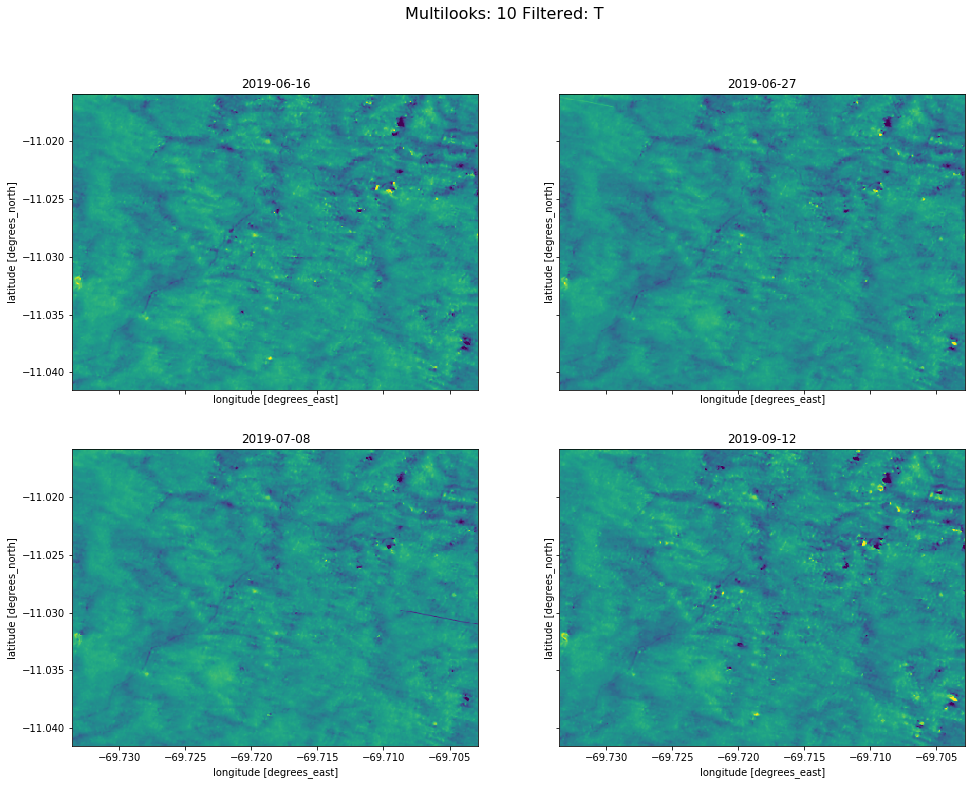

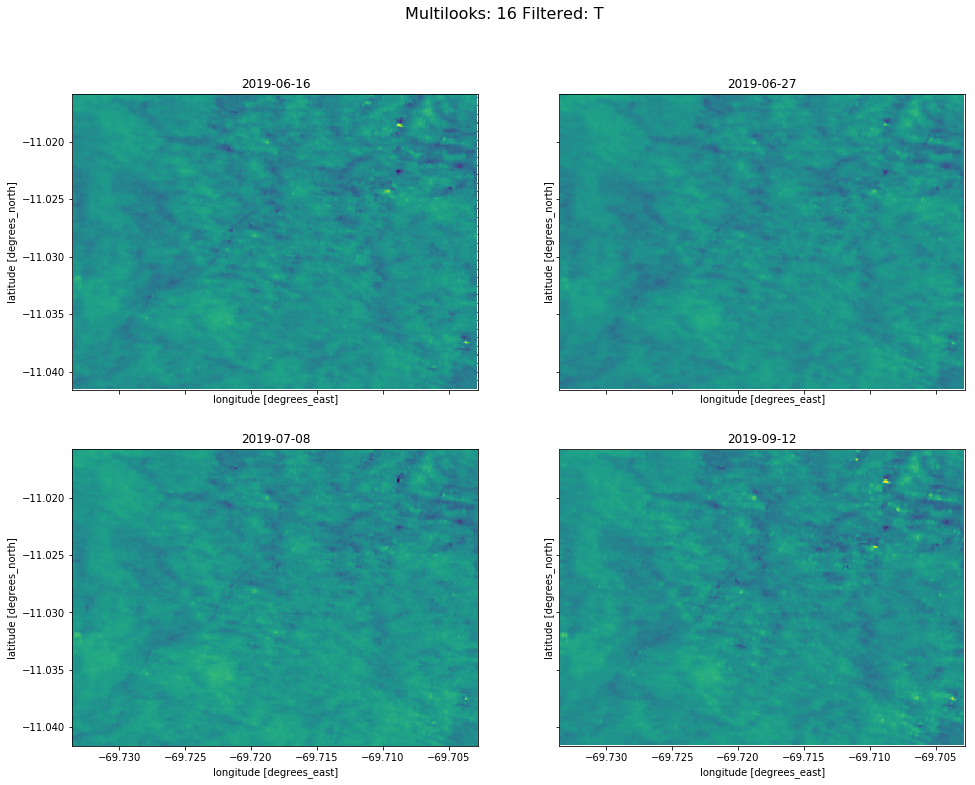

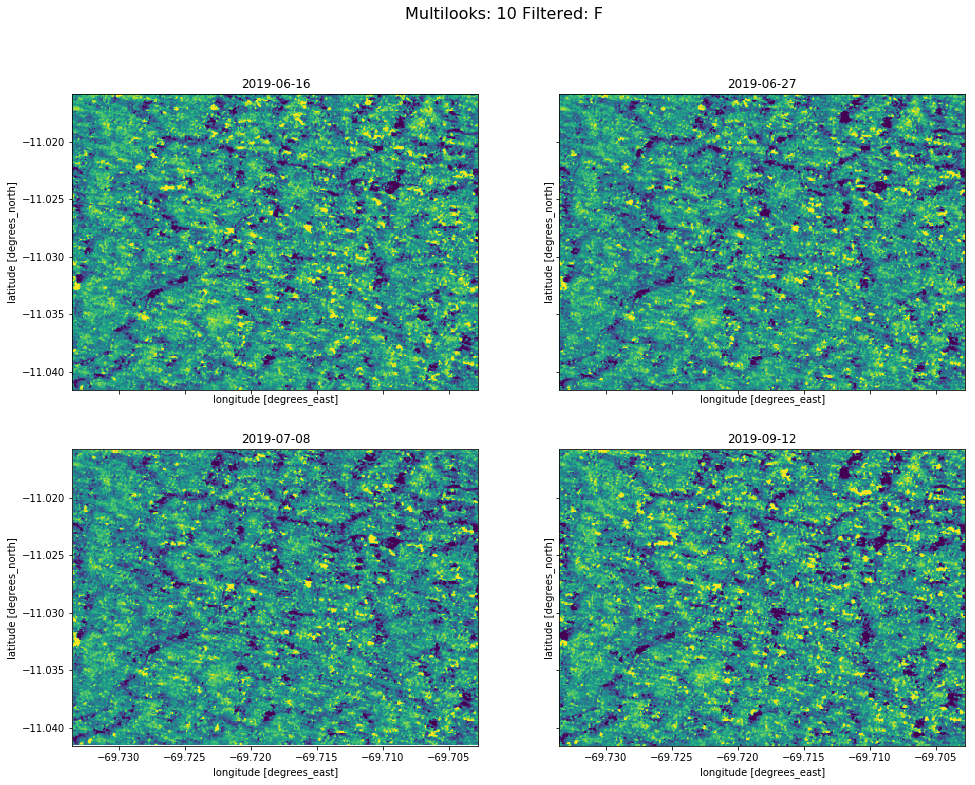

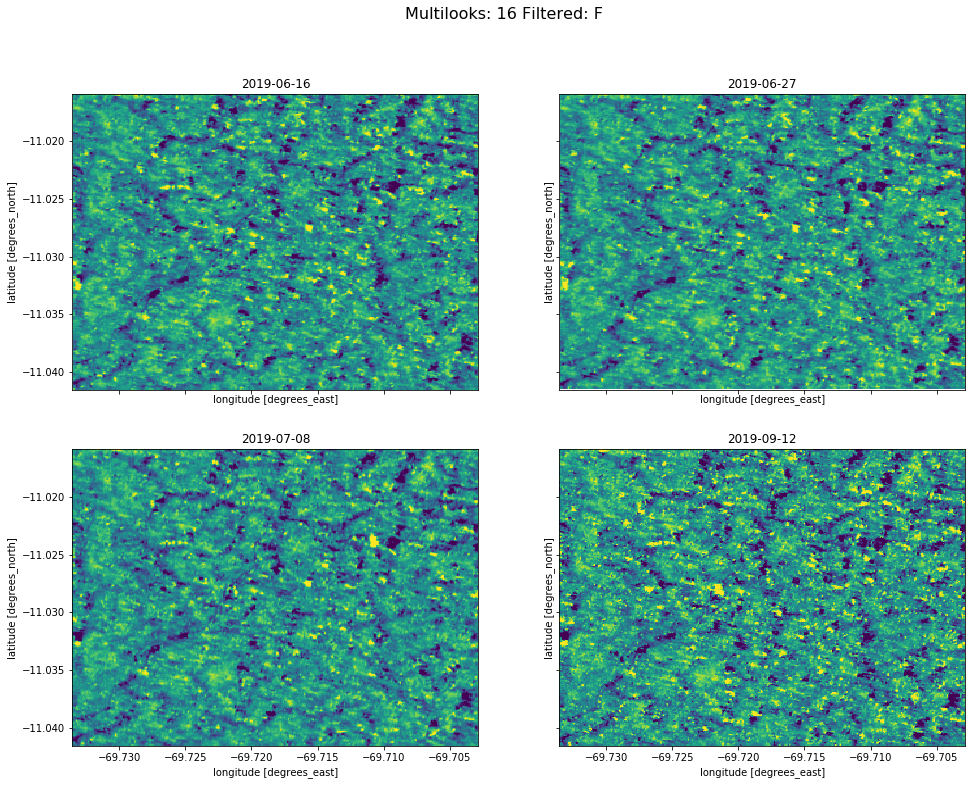

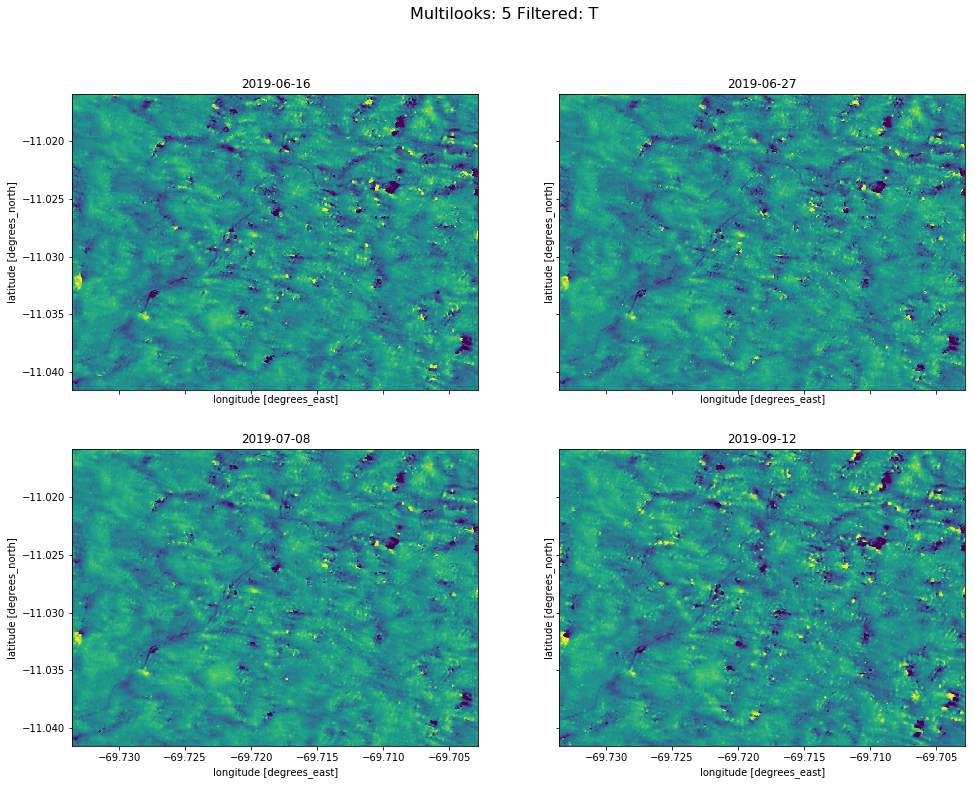

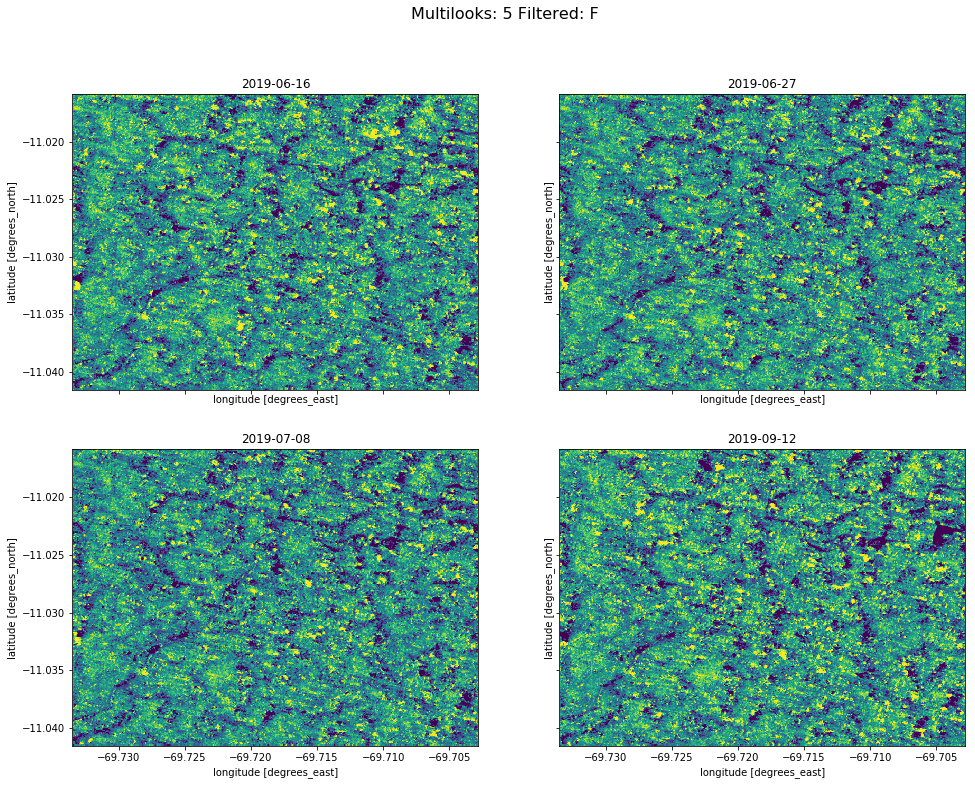

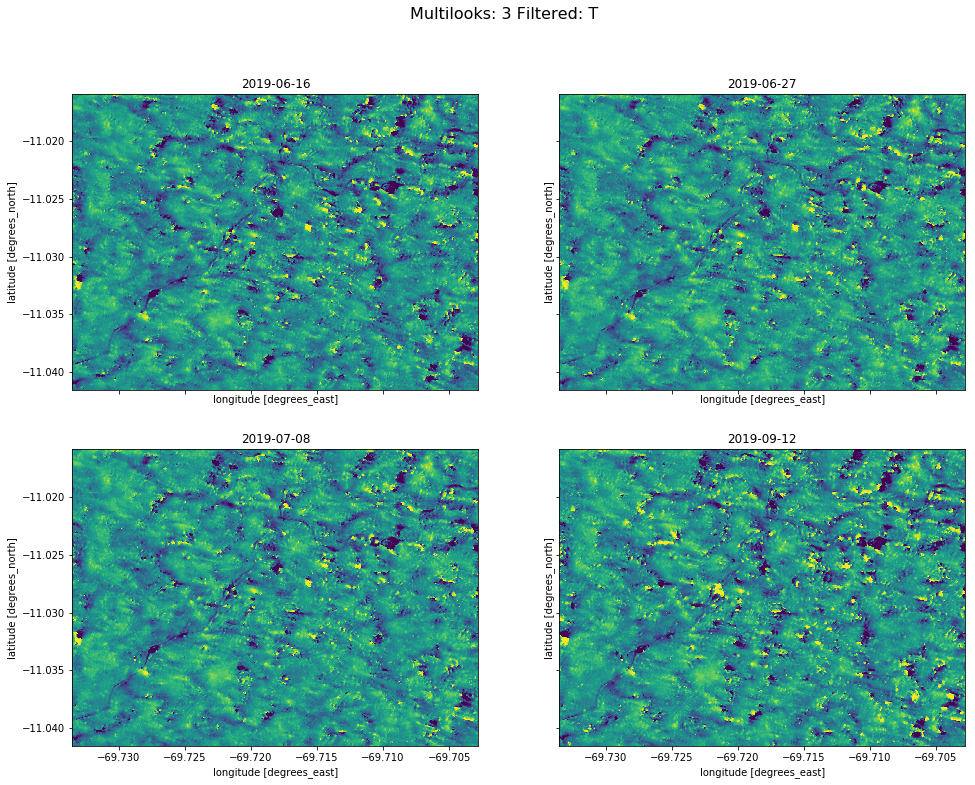

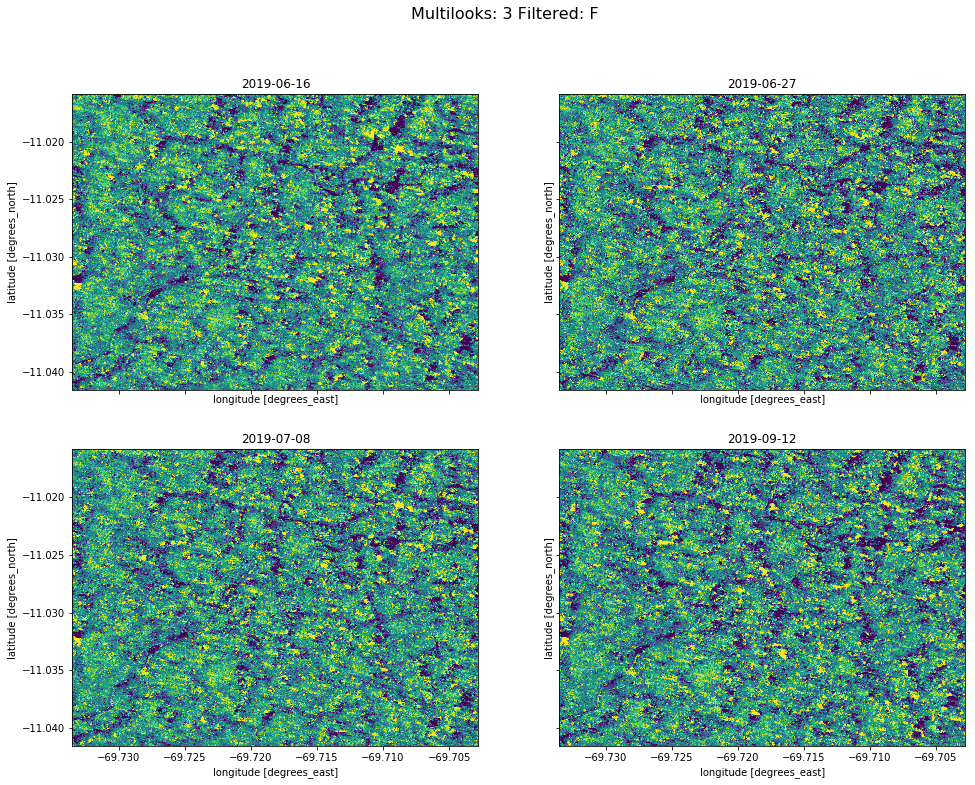

In [232]:
def plot_height_PER(file):
    
    ml = file.split('ML')[1].split('_')[0]
    filtered = file.split('_f')[1].split('_')[0]
    
    with xr.open_dataset(file) as ds:
    
        fig,axs = plt.subplots(2,2,figsize=(16,12),sharex=True,sharey=True)
        a=0
        for i in [0,2,3,5]:
            ds.height_corrected.isel(t=i).plot(ax=axs.reshape(-1)[a],vmin=-8,vmax=8,add_colorbar=False)
            axs.reshape(-1)[a].set_title(np.datetime_as_string(ds.t[i],unit='D'))
            a+=1

        fig.suptitle('Multilooks: '+ml+' Filtered: '+filtered, fontsize=16)
        plt.savefig(file.split('.nc')[0]+'_heightPlot.png',dpi=300)

for f in files:
    if 'PER' in f:
        print(f)
        plot_height_PER(f)

In [237]:
def clean_ds(f):
    with xr.open_dataset(f) as ds:
        if 'GAB' in f:
            keep = [0,1,3,5,6,7,8,10,11]
        elif 'PER' in f:
            keep = [0,2,3,5]
        ds = ds.isel(t=keep)
        ds.to_netcdf(f.split('.nc')[0]+'_clean.nc')

for f in files:
    print(f)
    clean_ds(f)

TDX_DEM_GAB_SM_ML10_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML10_fT_unwS_H_tiles10_merged.nc
TDX_DEM_GAB_SM_ML16_fF_unwS_H_tiles10_merged.nc
TDX_DEM_GAB_SM_ML3_fF_unwS_H_tiles10_merged.nc
TDX_DEM_GAB_SM_ML3_fT_unwS_H_tiles10_merged.nc
TDX_DEM_GAB_SM_ML5_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML16_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML10_fF_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML16_fF_unwS_H_tiles10_merged.nc
TDX_DEM_GAB_SM_ML16_fT_unwS_H_tiles10_merged.nc
TDX_DEM_GAB_SM_ML10_fF_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML5_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML5_fF_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML3_fT_unwS_H_tiles10_merged.nc
TDX_DEM_PER_HS_ML3_fF_unwS_H_tiles10_merged.nc
TDX_DEM_GAB_SM_ML5_fF_unwS_H_tiles10_merged.nc


In [236]:
files

['TDX_DEM_GAB_SM_ML10_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML10_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_GAB_SM_ML16_fF_unwS_H_tiles10_merged.nc',
 'TDX_DEM_GAB_SM_ML3_fF_unwS_H_tiles10_merged.nc',
 'TDX_DEM_GAB_SM_ML3_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_GAB_SM_ML5_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML16_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML10_fF_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML16_fF_unwS_H_tiles10_merged.nc',
 'TDX_DEM_GAB_SM_ML16_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_GAB_SM_ML10_fF_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML5_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML5_fF_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML3_fT_unwS_H_tiles10_merged.nc',
 'TDX_DEM_PER_HS_ML3_fF_unwS_H_tiles10_merged.nc',
 'TDX_DEM_GAB_SM_ML5_fF_unwS_H_tiles10_merged.nc']